# Exploratory Data Analysis

## Data Loading and Preliminary Checks: 
Load the dataset and perform basic checks for data types, missing values, and summary statistics.

In [1]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import ipywidgets as widgets
from IPython.display import display
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [2]:
file_path = 'final_dataset.xlsx'
data = pd.read_excel(file_path)

# Display the first few rows of the dataframe and its basic information
data_info = data.info()
data_head = data.head()
data_descriptive_stats = data.describe()

data_info, data_head, data_descriptive_stats

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26680 entries, 0 to 26679
Data columns (total 44 columns):
 #   Column                                          Non-Null Count  Dtype         
---  ------                                          --------------  -----         
 0   Date                                            26680 non-null  datetime64[ns]
 1   Open                                            26680 non-null  float64       
 2   High                                            26680 non-null  float64       
 3   Low                                             26680 non-null  float64       
 4   Close                                           26680 non-null  float64       
 5   Volume                                          26680 non-null  int64         
 6   Dividends                                       26680 non-null  float64       
 7   Stock Splits                                    26680 non-null  float64       
 8   Daily_Return                                  

(None,
         Date        Open        High         Low       Close   Volume  \
 0 2020-06-30  179.305945  183.533295  179.102439  182.802521  3102800   
 1 2020-07-01  183.968061  184.763579  180.859992  182.756287  2620100   
 2 2020-07-02  187.316608  187.779118  182.349254  182.598999  2699400   
 3 2020-07-06  186.243599  192.209977  186.049352  191.812225  3567700   
 4 2020-07-07  190.091704  190.285964  184.254827  184.412079  2853500   
 
    Dividends  Stock Splits  Daily_Return  Daily_Return_Percentage  ...  \
 0        0.0           0.0      3.496576                 1.912761  ...   
 1        0.0           0.0     -1.211774                -0.663055  ...   
 2        0.0           0.0     -4.717609                -2.583590  ...   
 3        0.0           0.0      5.568627                 2.903166  ...   
 4        0.0           0.0     -5.679625                -3.079855  ...   
 
         MA_30       MA_50        RSI      MACD  Signal_Line  \
 0  185.971379  177.444586  40.

The dataset contains **26,680 entries** and **44 columns**. Each row represents financial data for a specific date and ticker, with various financial metrics and technical indicators.

The key features include:

- **`Date`**: The date of the financial data.
- **`Open, High, Low, Close`**: Stock price information.
- **`Volume`**: Number of shares traded.
- **`Dividends, Stock Splits`**: Corporate actions.
- **`Daily_Return`**: The daily return of the stock.
- **`Target_1day, Target_5days, Target_30days`**: Target variables for stock prediction.
- **Various Financial Metrics**: Like Net Income, Diluted EPS, Total Revenue, etc.
- **Technical Indicators**: Such as `MA (Moving Averages)`, `RSI (Relative Strength Index)`, `MACD`, `Bollinger Bands`, etc.
- **Ticker**: The stock symbol.

Here are some key observations:

- **Price Metrics (`Open, High, Low, Close`)**: There's a wide range of values, as indicated by the standard deviation, suggesting significant variability among different stocks. The maximum values are quite high, which could be due to high-priced stocks or outliers.
- **Volume**: The trading volume varies greatly, with a large standard deviation. This is expected as trading volumes can differ significantly between stocks.
- **Dividends and Stock Splits**: Most values are 0, but there are some extreme values (like a maximum dividend of 6000 and stock split of 20), which are likely outliers or specific events.
- **Daily Return**: The average is close to zero, but the range (-0.27 to 0.37) indicates periods of high volatility.
- **Moving Averages (`MA_5, MA_10, MA_30, MA_50`)**: Similar to price metrics, there's a wide range, indicating diverse stock behaviors.
- **Technical Indicators (`RSI, MACD, Bollinger Bands`)**: The RSI ranges from 0.24 to 97.25, with an average around 51, indicating a balance between overbought and oversold conditions. MACD and Bollinger Bands also show a wide range, which is typical given their dependency on stock prices.
- **Volatility**: Varies between 0.05% to 17.87%, indicating some stocks are much more volatile than others.


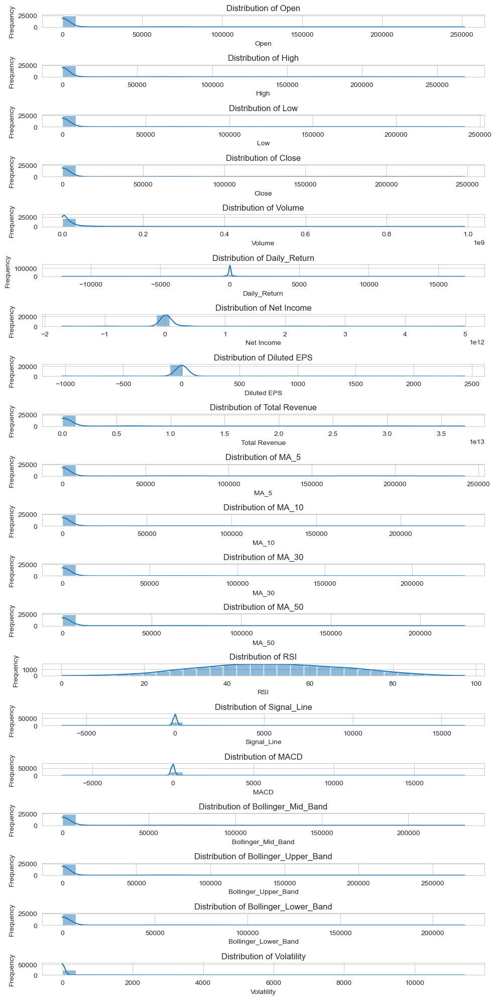

In [3]:
sns.set_style("whitegrid")

# Selecting a subset of columns for distribution analysis
columns_to_plot = ['Open', 'High', 'Low', 'Close', 'Volume', 'Daily_Return', 
                   'Net Income', 'Diluted EPS', 'Total Revenue', 'MA_5', 'MA_10', 'MA_30', 'MA_50', 'RSI',	'Signal_Line','MACD', 'Bollinger_Mid_Band', 'Bollinger_Upper_Band','Bollinger_Lower_Band', 'Volatility' ]

# Plotting distributions
fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(10, 20))

for i, col in enumerate(columns_to_plot):
    sns.histplot(data[col], ax=axes[i], kde=True, bins=30)
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_ylabel('Frequency')
    axes[i].set_xlabel(col)

plt.tight_layout()
plt.show()

The distributions for the key features like `'Open', 'High', 'Low', 'Close', 'Volume', 'Daily_Return', 'Net Income', 'Diluted EPS', and 'Total Revenue'` show that:

- **Stock Prices (`Open, High, Low, Close`)**: These might show skewed distributions, indicating a range of stock prices across different tickers. It's common for stock price distributions to be non-normal, often skewed towards lower prices.
- `Volume`: The trading volume is likely right-skewed, with more occurrences of lower trading volumes and fewer occurrences of extremely high volumes.
- `Daily_Return`: The distribution of daily returns often resembles a normal distribution but can have heavy tails, indicating days with unusually high gains or losses.
- **Financial Metrics** (`Net Income, Diluted EPS, Total Revenue`): These also tend to be skewed, reflecting the varied financial health and sizes of different companies.

In [4]:
fig = px.scatter(data_frame=data, 
                 x='Volume', 
                 y='Daily_Return', 
                 size='Volatility', 
                 color='Ticker', 
                 hover_data=['Open', 'Close', 'Net Income'],
                 title="Volume vs Daily Return with Volatility and Stock Information")

fig.update_layout(
    plot_bgcolor='black', # Cambia il colore di sfondo dell'area del plot
    paper_bgcolor='black', # Cambia il colore di sfondo intorno all'area del plot
    font_color='white' # Cambia il colore del testo per migliorare la visibilità su sfondo nero
)

fig.update_traces(marker=dict(opacity=0.7))
# Ad esempio, per rendere i punti più piccoli, potresti provare un valore più alto di sizeref
fig.update_traces(marker=dict(sizeref=2 * max(data['Volatility']) / 40**2))



fig.show()

In [5]:
low_volatility = data[data['Volatility'] <= 20]

fig = px.scatter(data_frame=low_volatility, 
                 x='Volume', 
                 y='Daily_Return', 
                 size='Volatility', 
                 color='Ticker', 
                 hover_data=['Open', 'Close', 'Net Income'],
                 title="Volume vs Daily Return with Volatility and Stock Information")

fig.update_layout(
    plot_bgcolor='black', # Cambia il colore di sfondo dell'area del plot
    paper_bgcolor='black', # Cambia il colore di sfondo intorno all'area del plot
    font_color='white' # Cambia il colore del testo per migliorare la visibilità su sfondo nero
)

fig.update_traces(marker=dict(opacity=0.7))

The scatter plot vividly displays a spectrum of trading activity across various stocks, represented by unique colors for each ticker symbol. Notably, the ticker '005380KS' appears frequently with a range of volumes, as indicated by the numerous green dots. These dots are primarily concentrated toward the lower end of the volume spectrum, suggesting that '005380KS' typically trades with less volume. The daily returns for this ticker are mostly clustered near the zero mark, implying that extreme returns are not a common event for this stock.

The size of the dots, which represents the stock's volatility, shows that larger dots, and hence higher volatility, are not confined to any single volume bracket or daily return level. This suggests that volatility can spike regardless of the trading volume or the direction of the return on a given day.

The plot also features other tickers like 'AAPL', indicated by light pink dots, and 'AMZN'. These particular tickers appear less frequently but are scattered across a wider volume range. This pattern could suggest a more variable trading volume for these well-known tech giants.

The hover data feature of the plot allows viewers to delve into specific details such as the opening and closing prices, as well as the net income on particular days for each stock, providing a more comprehensive view of each stock's performance. For example, hovering over a particularly large dot could reveal a day with significant price movement and higher volatility, possibly aligned with a corporate announcement or market event.

## Correlation Analysis
Examine the distribution of key features like `'Open', 'Close', 'Volume'`, etc.

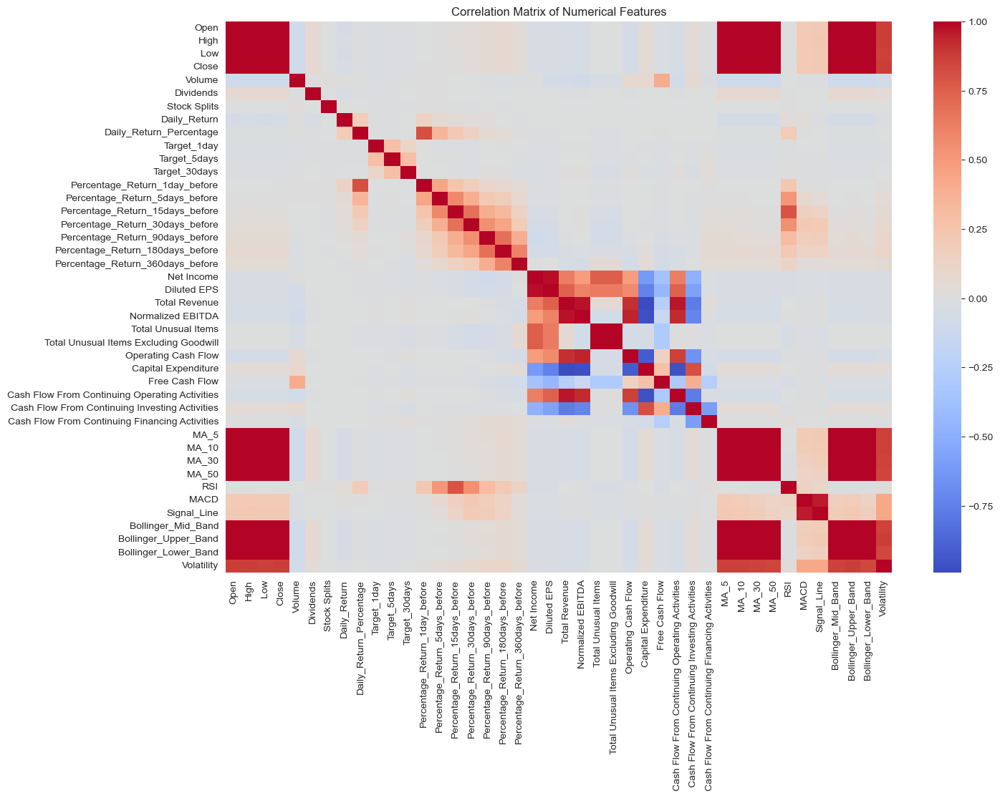

In [6]:
# Dropping non-numerical columns (like 'Ticker') before computing the correlation matrix
numerical_data = data.select_dtypes(include=['float64', 'int64'])
correlation_matrix_numerical = numerical_data.corr()

# Plotting the heatmap for the numerical data
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix_numerical, cmap='coolwarm', annot=False, fmt=".1f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

The heatmap provides a visual representation of the correlation matrix, showing how different features are correlated with each other. However, due to the large number of features, it's quite dense and a bit challenging to extract specific insights at this resolution.

For a more focused analysis, let's zoom in on the correlations of the target variables (`'Target_1day', 'Target_5days', 'Target_30days'`) with other features. This will give us a clearer view of which features might be more influential for predicting stock movements. I'll extract and visualize these specific correlations.

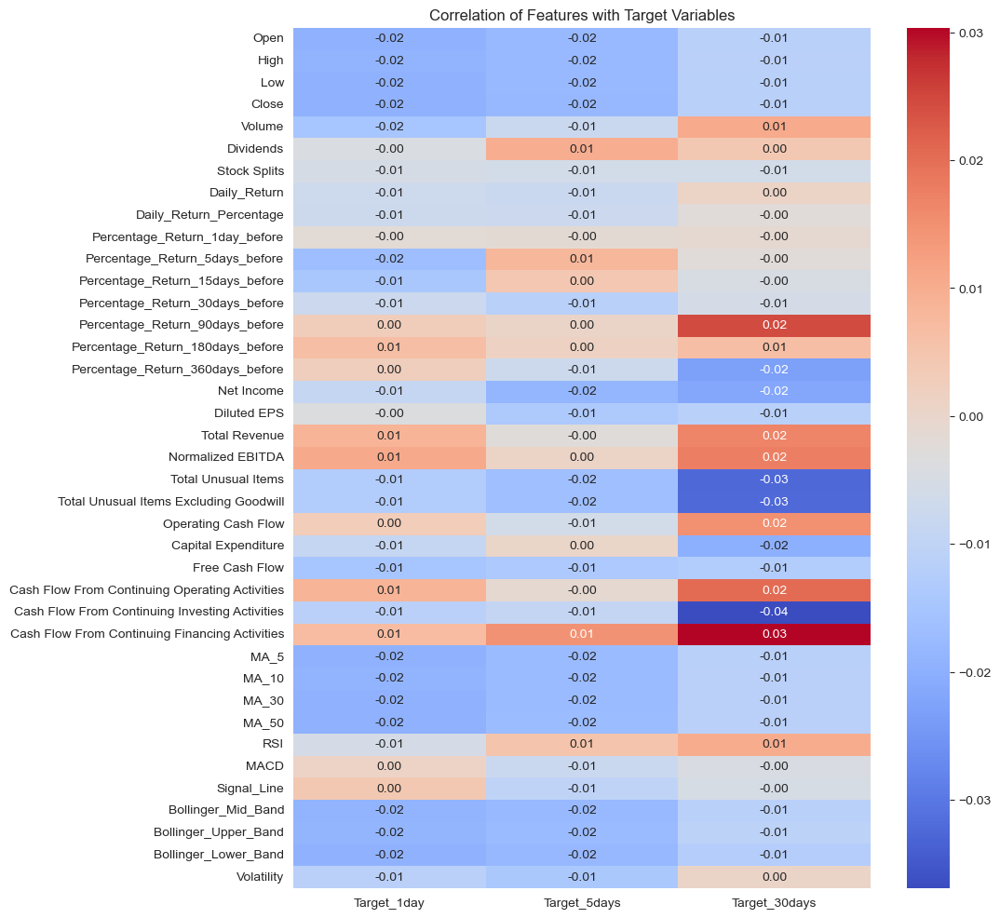

In [7]:
# Focusing on the correlation of target variables with other features
target_features = ['Target_1day', 'Target_5days', 'Target_30days']
correlation_with_targets = correlation_matrix_numerical[target_features].drop(target_features)

# Plotting the correlations with target variables
plt.figure(figsize=(10, 12))
sns.heatmap(correlation_with_targets, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Correlation of Features with Target Variables')
plt.show()


The heatmap now focuses on the correlations between the target variables (`'Target_1day', 'Target_5days', 'Target_30days'`) and other features in the dataset. Here's what we can infer:

Certain features show a moderate to low level of correlation with the target variables.
- It's important to note that **correlation does not imply causation**, but it can give us an idea of which features might be useful in predictive modeling.
- The correlations are **relatively low**, which is typical in financial datasets due to the complexity and unpredictability of stock price movements.
- Next, let's perform a time series analysis visualization. Given the financial nature of the data, it's crucial to understand how certain key variables like `'Close', 'Volume'`, and technical indicators like `'RSI', 'MACD'` change over time. 

## Time Series Analysis
Let's start by plotting all the stock performance plot foreach unique ticker to take a general insight on what we are studying.

In [8]:
def plot_stock_performance(ticker, df):
    df_ticker = df[df['Ticker'] == ticker]

    fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                        vertical_spacing=0.1, subplot_titles=(f'{ticker} Stock Prices', f'{ticker} Volume'))

    fig.add_trace(go.Candlestick(x=df_ticker['Date'],
                                 open=df_ticker['Open'],
                                 high=df_ticker['High'],
                                 low=df_ticker['Low'],
                                 close=df_ticker['Close'],
                                 name='OHLC'), row=1, col=1)

    fig.add_trace(go.Bar(x=df_ticker['Date'], y=df_ticker['Volume'], name='Volume'), row=2, col=1)

    # layout
    fig.update_layout(title=f'Stock Performance for {ticker}', xaxis_rangeslider_visible=False)
    return fig
ticker_list = sorted(list(set(data["Ticker"])))
ticker_dropdown = widgets.Dropdown(
    options=ticker_list,
    value=random.choice(ticker_list), # Seleziona uno stock random all'inizio
    description='Ticker:',
)

def update_plot(ticker):
    fig = plot_stock_performance(ticker, data)
    fig.show()

interactive_plot = widgets.interactive(update_plot, ticker=ticker_dropdown)

display(interactive_plot)

interactive(children=(Dropdown(description='Ticker:', index=7, options=('005380KS', '005930KS', '0700HK', '139…

## Technical Indicators Analysis
### ROI Analysis

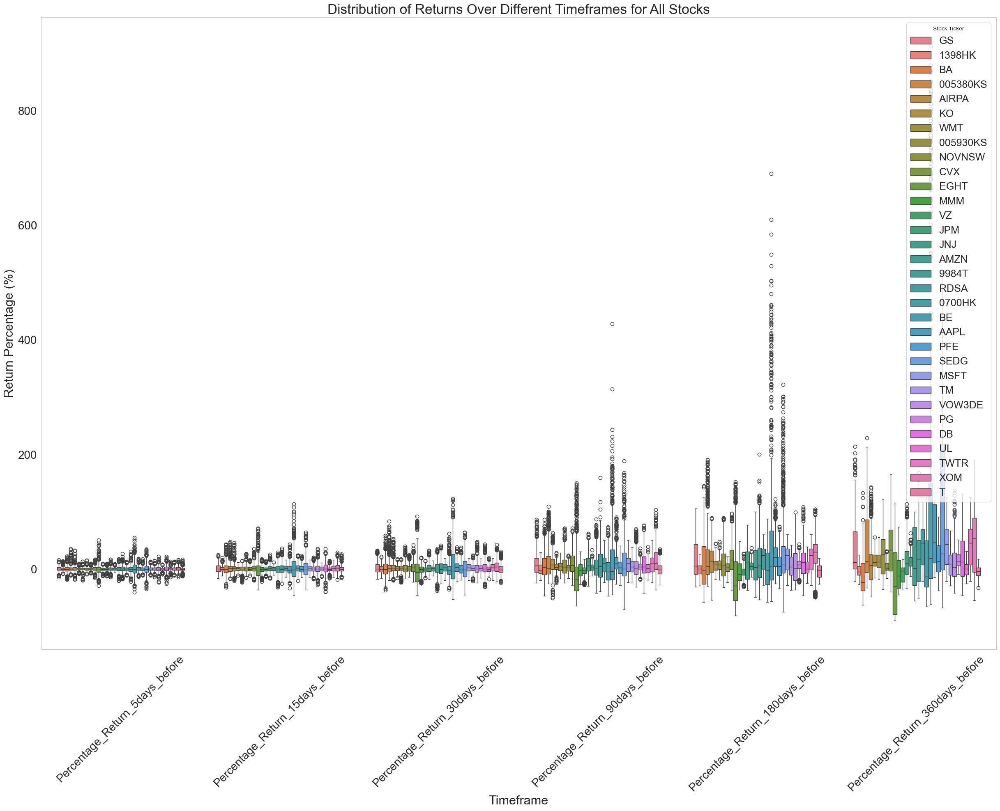

In [9]:
timeframes = [
    "Percentage_Return_5days_before", 
    "Percentage_Return_15days_before", 
    "Percentage_Return_30days_before",
    "Percentage_Return_90days_before", 
    "Percentage_Return_180days_before",
    "Percentage_Return_360days_before",
]

# Melting the data for easier plotting
melted_data = data.melt(id_vars=['Ticker'], value_vars=timeframes, var_name='Timeframe', value_name='Return_Percentage')

plt.figure(figsize=(30, 20))
sns.boxplot(x='Timeframe', y='Return_Percentage', hue='Ticker', data=melted_data)
plt.title('Distribution of Returns Over Different Timeframes for All Stocks', fontsize=24)
plt.xlabel('Timeframe', fontsize=22)
plt.ylabel('Return Percentage (%)', fontsize=22)
plt.xticks(rotation=45, fontsize=20)
plt.yticks(fontsize=20)
plt.legend(title='Stock Ticker', loc='upper right', fontsize=18)
plt.grid(axis='y')
plt.show()

The boxplot suggests the following:

- **Return Distribution**: The interquartile range (IQR) in the boxplots indicates the middle 50% of returns for each stock and timeframe, which is useful for assessing the typical return dispersion.
- **Volatility Trends**: The length of the whiskers relative to the IQR can be used as a proxy for volatility. Longer whiskers relative to the IQR suggest higher volatility.
- **Timeframe Sensitivity**: Stocks with increasing variability over longer timeframes may be more sensitive to macroeconomic factors or have higher inherent business risks.
- **Outlier Analysis**: Points beyond the whiskers are outliers and may represent extreme events or anomalies. Clusters of outliers could indicate periods of market stress or company-specific issues.
- **Cross-sectional Analysis**: Comparing boxes across different stocks for the same timeframe can provide insight into relative performance and risk.

### RSI Analysis

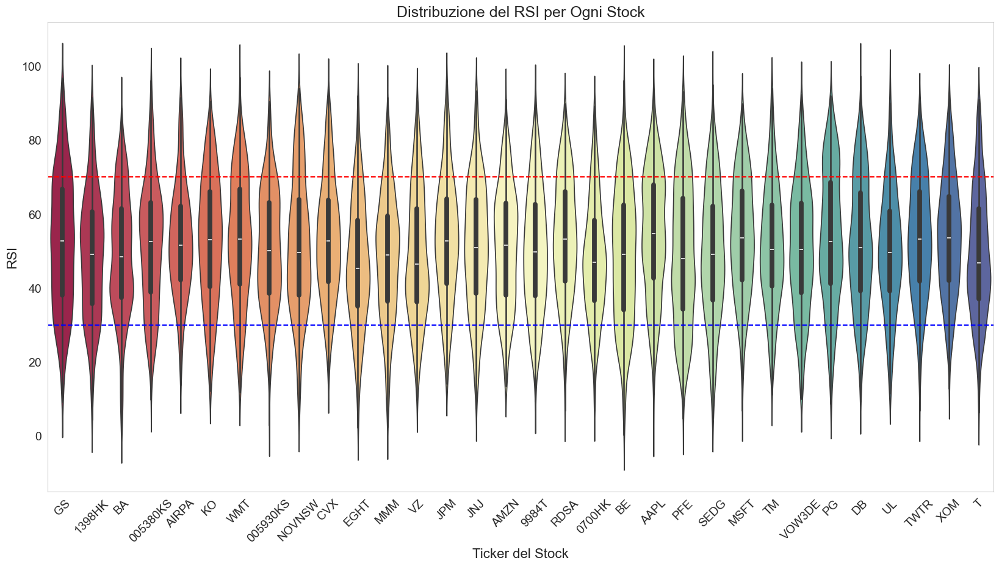

In [10]:

# Plotting the violin plot for RSI distribution of each stock
plt.figure(figsize=(20, 10))
sns.violinplot(x='Ticker', y='RSI', data=data, palette='Spectral')
plt.title('Distribuzione del RSI per Ogni Stock', fontsize=18)
plt.xlabel('Ticker del Stock', fontsize=16)
plt.ylabel('RSI', fontsize=16)
plt.axhline(70, ls='--', color='red')  # Soglia di overbought
plt.axhline(30, ls='--', color='blue') # Soglia di oversold
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y')
plt.show()


The violin plot for the RSI distribution across various stocks offers a detailed visual representation of the momentum characteristics for each stock. Here are some specific technical insights:

- **Median RSI Values**: Most stocks have median RSI values hovering around the mid-range (50), which is neutral territory, indicating no strong momentum in either direction for the median stock.
- **Overbought Stocks**: Several stocks show parts of their distribution extending above the overbought threshold (70), indicating that these stocks frequently enter overbought territory. (For models)Can be important to analyze the frequency and duration of these occurrences for potential overbought conditions.
- **Oversold Stocks**: A few stocks also extend below the oversold threshold (30). Persistent `RSI` levels below this line can suggest that a stock is being oversold, which might be a buying opportunity if other conditions are favorable.
- **RSI Distribution Shape**: The shape of the violins indicates the probability density and skewness of the RSI values. Wider sections represent a higher probability of the RSI assuming that value. Asymmetrical violins suggest a skew towards either overbought or oversold conditions.
- **RSI Variability**: The varied width of the violins suggests differences in the variability of the `RSI` among the stocks. A wider violin indicates greater variability and potentially higher volatility in price movement.
- **Potential Anomalies**: The tails of the violins represent the extremes of the `RSI` distribution. Long tails touching or crossing the overbought and oversold thresholds could indicate outlier events or anomalies in stock behavior.
- **Inter-stock Comparison**: The plot allows for a quick comparison across stocks. Stocks with similar RSI distributions might be subject to similar trading dynamics or market perceptions.

## Preliminary Suggestions for Model Selection

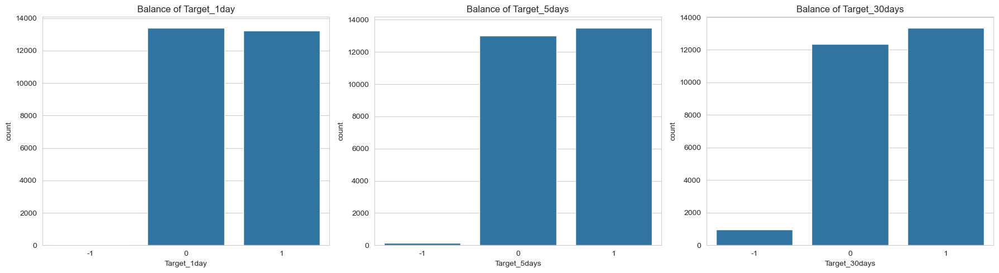

In [11]:

# Plotting the balance of each target feature side by side
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 1 row, 3 columns

for i, col in enumerate(target_features):
    sns.countplot(x=col, data=data, ax=axes[i])
    axes[i].set_title(f'Balance of {col}')

plt.tight_layout()
plt.show()


The target features Target_1day, Target_5days, and Target_30days are relatively balanced with a slight majority of one class in each. No need to balanced the dataset.